<img src="header_escom26.jpg" alt="header" style="height:200px;">

# Image Analysis

**Pérez Leal Rodolfo**

Practice 1: Otsu's method for binarizing images

<p>
    The Otsu's Method is used for binarizing images.<br>
    Otsu calculate a theshold on a gray scale image to made the binary images.<br>
    So first we need to transform a color image into a grayscale image.
</p>

The First step to made is import **numphy** and **matplotlib** packages from **PIL**.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from PIL import Image

Using **PIL** and **matplotlib** to open, read and display the images.

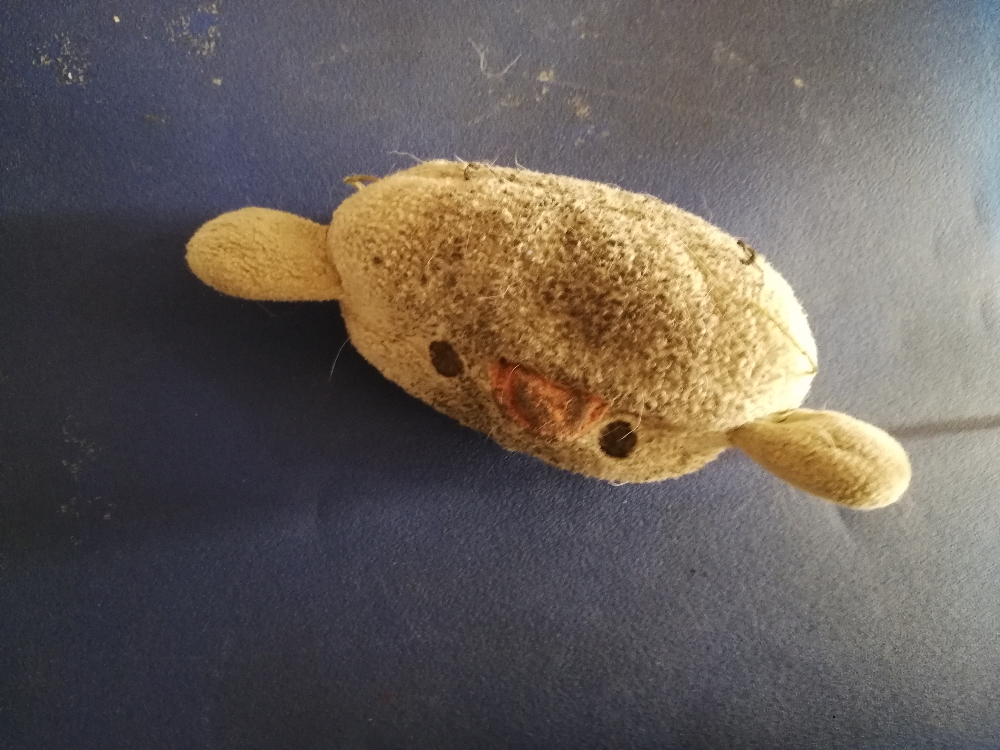

In [2]:
filepath = "./" #The current directory
#filename = "coins.png"
#filename = "cargador.jpg"
#filename = "cubo1.jpg"
#filename = "cubo2.jpg"
#filename = dulces.jpg
filename = "juguete.jpg"
pic = Image.open(filepath + filename) #Open the image
pic #Diplays the image in the notebook

Convert the image into an array to isolate the **RED**, **GREEN** and **BLUE** channel.

Separating channels
Wall time: 2.09 s


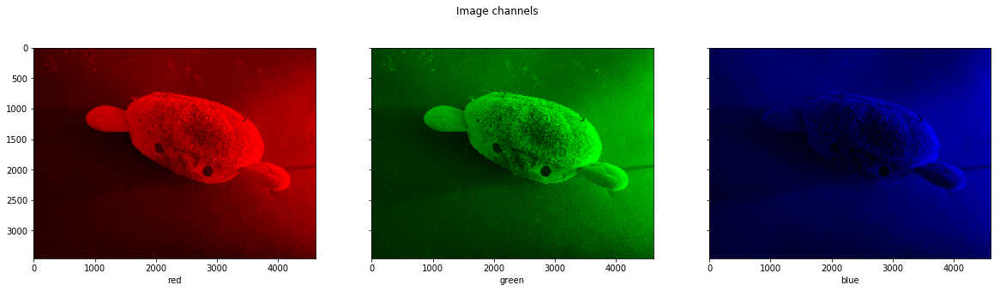

In [3]:
pic_arr = np.asarray(pic) #converts the image to an Numpy Array
pic_red = pic_arr.copy()
pic_green=pic_arr.copy()
pic_blue=pic_arr.copy()

def separateChannels():
    #red channel
    pic_red[:,:,1] = 0
    pic_red[:,:,2] = 0

    #green channel
    pic_green[:,:,0] = 0
    pic_green[:,:,2] = 0

    #blue channel
    pic_blue[:,:,0] = 0
    pic_blue[:,:,1] = 0

    fig, axs = plt.subplots(1, 3, figsize = (20,5), sharey = True)
    axs[0].imshow(pic_red)
    axs[0].set_xlabel("red")
    axs[1].imshow(pic_green)
    axs[1].set_xlabel("green")
    axs[2].imshow(pic_blue)
    axs[2].set_xlabel("blue")
    fig.suptitle('Image channels')

print("Separating channels")
%time separateChannels()

Obtain the height and width from the image and make a copy from the original image to convert to gray scale

In [4]:
H = pic_arr.shape[0]
W = pic_arr.shape[1]
pic_gray = pic_arr.copy()

In [5]:
def colorToGray():
    for i in range(0, H):
        for j in range(0, W):
            r = float(pic_gray[i,j,0])*0.2126
            g = float(pic_gray[i,j,1])*0.7152
            b = float(pic_gray[i,j,2])*0.0722
            gray = int(r+g+b)
            pic_gray[i,j,0] = gray
            pic_gray[i,j,1] = gray
            pic_gray[i,j,2] = gray

Converting the image to gray scale
Wall time: 40.3 s


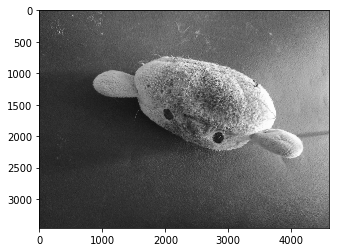

In [6]:
print("Converting the image to gray scale")
%time colorToGray()            
plt.imshow(pic_gray)

Start the arrays for the histograms with 0

In [7]:
hist_red = np.zeros(256)
hist_blue = np.zeros(256)
hist_green = np.zeros(256)
hist_gray = np.zeros(256)

Create the function to calculate the histogram for a function

In [8]:
def histograms():
    for i in range(0, H):
        for j in range(0, W):
            hist_red[pic_red[i,j,0]] += 1
            hist_green[pic_green[i,j,1]] += 1
            hist_blue[pic_blue[i,j,2]] += 1
            hist_gray[pic_gray[i,j,0]] += 1


Call the method to and plot the histograms

Making the histograms
Wall time: 1min 10s


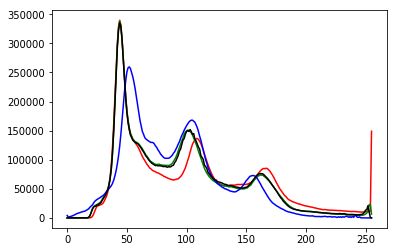

In [9]:
print("Making the histograms")

%time histograms()
#plot the histograms
plt.plot(hist_red, color = "r")
plt.plot(hist_green, color = "g")
plt.plot(hist_blue, color = "b")
plt.plot(hist_gray, color = "black")
plt.show()

Use the Otsu Method to calculate the Treshold

In [10]:
def otsu():
    no_pix = H*W;
    print("Cantidad de pixeles: ", no_pix)
    #calculate Pi and i*Pi and save on list to posterior operations
    Pi = []
    iPi = []
    for i in range(0,256):
        pi = float(hist_gray[i]/no_pix)
        ipi = float(i*pi)
        Pi.append(pi)
        iPi.append(ipi)
   
    totaliPi = sum(iPi)
    print("Suma Total iPi: ", totaliPi)
    #calculate the values of sigma
    sigma = -1
    for t in range(0,256):
        s = -1
        w0 = 0 
        sumiPi = 0
        for i in range(0, t+1):
            w0 = w0 + Pi[i]
            w1 = 1 - w0
            sumiPi = sumiPi + iPi[i]
            
        if w0 == 0 or w1 == 0:
            s = 0
            
        else:
            mu0 = float(sumiPi/w0)
            sumiPi = totaliPi - sumiPi 
           
            mu1 = float(sumiPi/w1)
            f1 = w0 * w1 
            f2 = mu0 - mu1
            f3 = pow(f2, 2) # (mu0 - mu1)^2
            s = f1 * f3
        
        if s > sigma:
            sigma = s
            T = t

   
    print ('Otsu Threshold value: ', T)
    return T

Call the otsu method to obtain the threshold

In [11]:
print("Calculing Threshold...")
%time T = otsu()

Calculing Threshold...
Cantidad de pixeles:  15925248
Suma Total iPi:  95.26940842616708
Otsu Threshold value:  108
Wall time: 13.2 ms


Define the variables to make the binaryzing process reshaping the image into a one dimensional array

In [12]:
pic_binary = pic_arr.copy()
no_pix = H*W
noChannels = pic_binary.shape[2]
array_size = no_pix*noChannels
pic_binary2 = pic_binary.reshape(array_size)

Make the binary Image function

In [13]:
def binary(T):
    for i in range(0, array_size, noChannels):
        bn = 0  if pic_binary2[i] < T else 255
        pic_binary2[i] = bn #R
        pic_binary2[i+1] = bn #G
        pic_binary2[i+2] = bn #B
    pic_binary = pic_binary2.reshape((H,W,noChannels))


Calling the binary function to get the final binary image

Binaryzing...
Wall time: 54.4 s


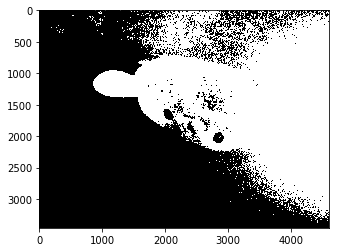

In [14]:
print("Binaryzing...")                
%time binary(T)                
plt.imshow(pic_binary)  

Como conclusión, puedo decir que la implementacion del allgoritmo no fue tan complicada, el problema fue intentar hacer que no se tardara tanto en ejecutar, incluso con las recomendaciones del profesor, el programa entero se tarda aproximadamente 3 minutos en ejecutarse